In [154]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, AffinityPropagation, AgglomerativeClustering, Birch, MiniBatchKMeans, OPTICS, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, rand_score, adjusted_rand_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE
import umap
import plotly.express as px

In [2]:
spot_df = pd.read_csv('data/spotify_playlist.csv')

In [3]:
spot_df.head()

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


# Data Understanding

In [4]:
spot_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6514 entries, 0 to 6513
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            6513 non-null   object 
 1   artist_id         6514 non-null   object 
 2   popularity        6514 non-null   int64  
 3   album             6513 non-null   object 
 4   track_name        6513 non-null   object 
 5   track_id          6514 non-null   object 
 6   danceability      6514 non-null   float64
 7   energy            6514 non-null   float64
 8   key               6514 non-null   int64  
 9   loudness          6514 non-null   float64
 10  mode              6514 non-null   int64  
 11  speechiness       6514 non-null   float64
 12  instrumentalness  6514 non-null   float64
 13  liveness          6514 non-null   float64
 14  valence           6514 non-null   float64
 15  tempo             6514 non-null   float64
 16  duration_ms       6514 non-null   int64  


In [5]:
spot_df.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6.514000e+03,6514.000000
mean,38.185293,0.505411,0.718306,5.152748,-7.549406,0.672398,0.078551,0.138753,0.207243,0.502779,125.020099,2.247691e+05,3.934602
std,25.599819,0.164042,0.245218,3.565083,4.278693,0.469375,0.070419,0.287835,0.163056,0.243474,30.364398,7.749594e+04,0.321725
min,0.000000,0.072200,0.000685,0.000000,-41.932000,0.000000,0.022500,0.000000,0.009670,0.028600,36.172000,2.845500e+04,1.000000
25%,13.000000,0.391000,0.581000,2.000000,-9.526750,0.000000,0.037400,0.000000,0.096000,0.313000,100.621250,1.782718e+05,4.000000
50%,42.000000,0.503000,0.795000,5.000000,-6.363500,1.000000,0.052000,0.000124,0.143000,0.497000,122.998500,2.157000e+05,4.000000
75%,59.000000,0.619000,0.917000,8.000000,-4.615250,1.000000,0.088775,0.048575,0.290000,0.694000,144.746000,2.579930e+05,4.000000
max,89.000000,0.979000,0.999000,11.000000,-0.140000,1.000000,0.948000,0.994000,0.981000,0.995000,214.419000,1.050827e+06,5.000000


In [6]:
spot_df.shape

(6514, 18)

In [7]:
spot_df.isna().sum()

artist              1
artist_id           0
popularity          0
album               1
track_name          1
track_id            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64

In [8]:
 spot_df[spot_df.isna().any(axis=1)]

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
4400,NaN,0LyfQWJT6nXafLPZqxe9Of,0,NaN,NaN,0lMrWcrVXHPEuVBuc0nRzZ,0.804,0.758,4,-4.819,1,0.0483,0.331,0.125,0.424,127.946,230635,4


In [9]:
spot_df.dropna(inplace=True)

In [10]:
spot_df.isna().sum()

artist              0
artist_id           0
popularity          0
album               0
track_name          0
track_id            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64

In [11]:
spot_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6513 entries, 0 to 6513
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            6513 non-null   object 
 1   artist_id         6513 non-null   object 
 2   popularity        6513 non-null   int64  
 3   album             6513 non-null   object 
 4   track_name        6513 non-null   object 
 5   track_id          6513 non-null   object 
 6   danceability      6513 non-null   float64
 7   energy            6513 non-null   float64
 8   key               6513 non-null   int64  
 9   loudness          6513 non-null   float64
 10  mode              6513 non-null   int64  
 11  speechiness       6513 non-null   float64
 12  instrumentalness  6513 non-null   float64
 13  liveness          6513 non-null   float64
 14  valence           6513 non-null   float64
 15  tempo             6513 non-null   float64
 16  duration_ms       6513 non-null   int64  


In [12]:
num_features = spot_df.select_dtypes(exclude=['object'])

In [13]:
num_features.drop(['time_signature', 'mode'], axis=1, inplace=True)

In [14]:
num_features

,popularity,danceability,energy,key,loudness,speechiness,instrumentalness,liveness,valence,tempo,duration_ms
0,8,0.534,0.887,0,-3.777,0.0345,0.000099,0.3250,0.720,122.494,249293
1,0,0.257,0.819,7,-3.562,0.0422,0.015000,0.3240,0.267,150.354,308560
2,64,0.268,0.459,7,-6.948,0.0346,0.000000,0.1190,0.172,64.223,179200
3,69,0.693,0.497,2,-7.316,0.1190,0.000000,0.2580,0.473,81.308,122067
4,0,0.556,0.945,0,-4.347,0.0496,0.000004,0.3940,0.781,122.875,224307
...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0.2750,0.000004,0.3290,0.695,98.104,336917
6510,42,0.852,0.705,2,-10.981,0.0582,0.000002,0.1260,0.833,104.556,246040
6511,70,0.665,0.910,6,-4.682,0.2230,0.000000,0.2270,0.887,84.099,293973
6512,66,0.634,0.845,11,-5.058,0.3520,0.000005,0.0598,0.929,94.000,237027


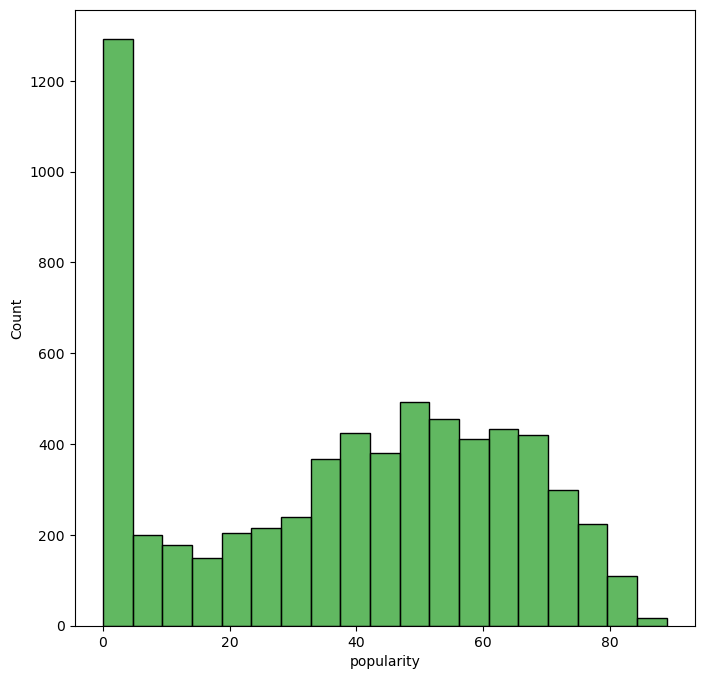

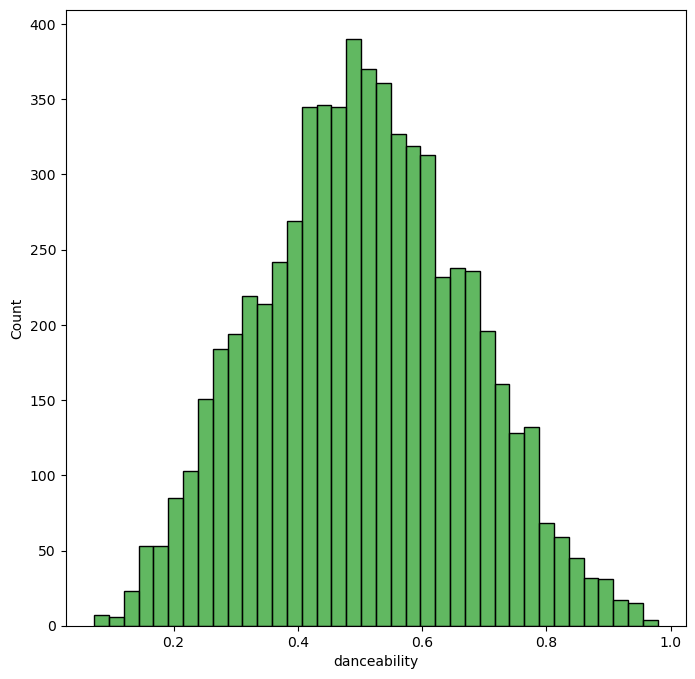

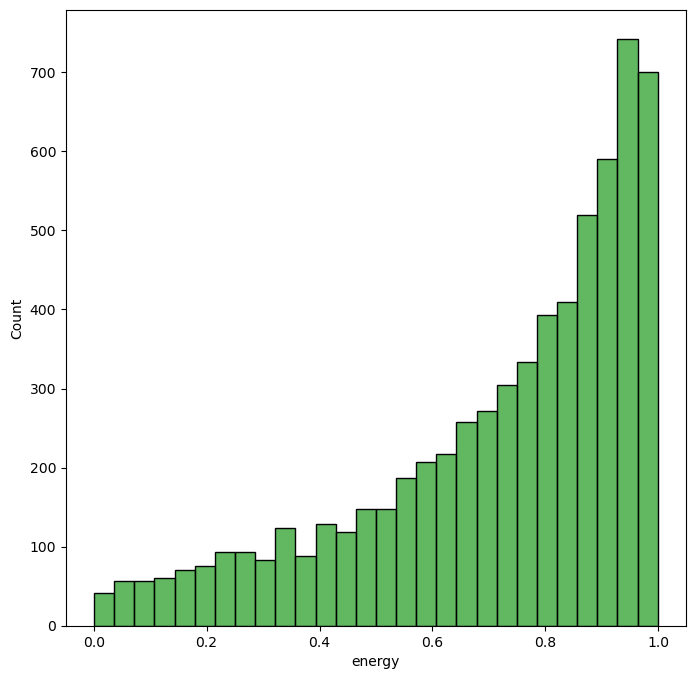

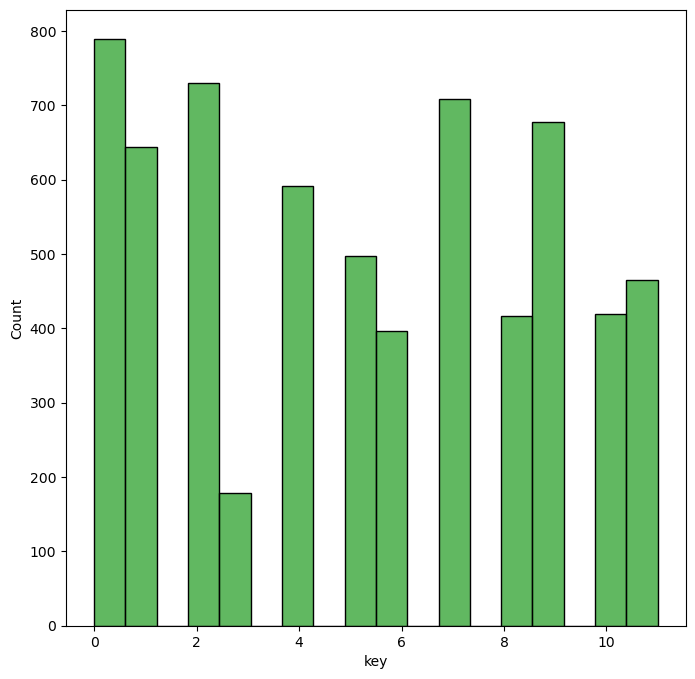

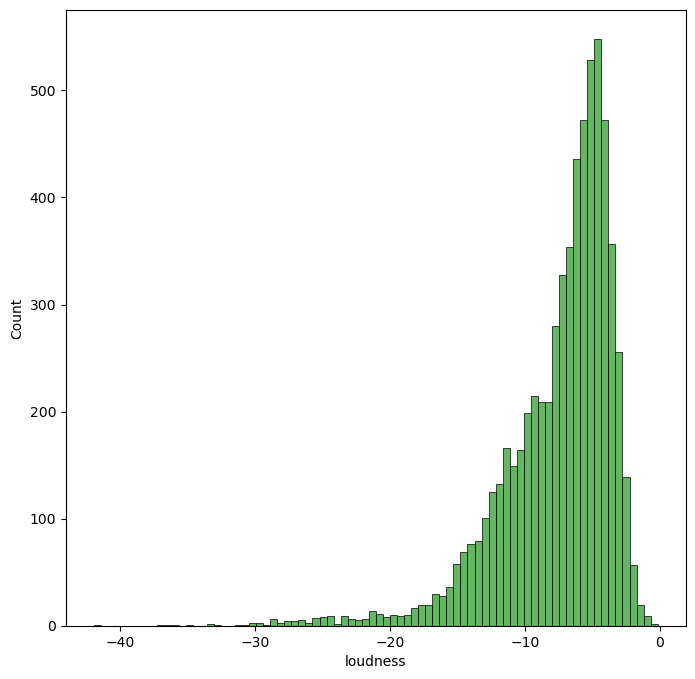

...

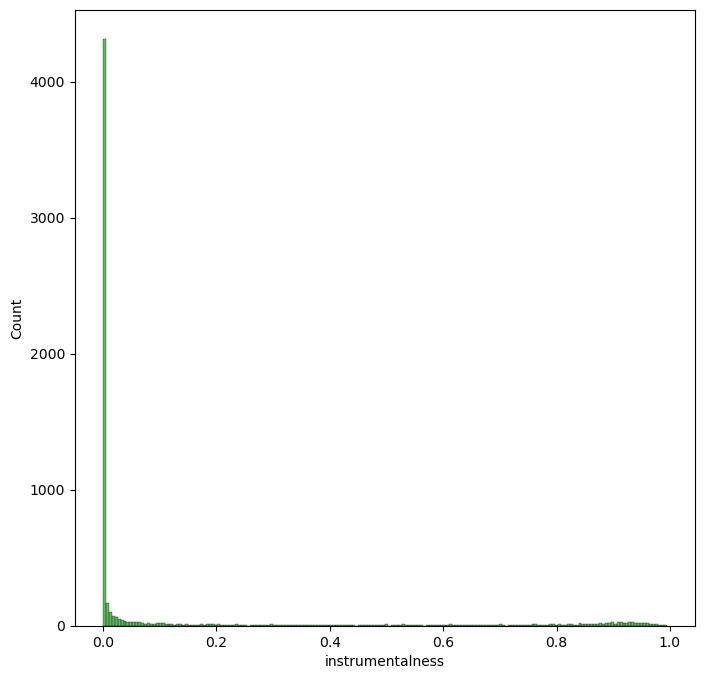

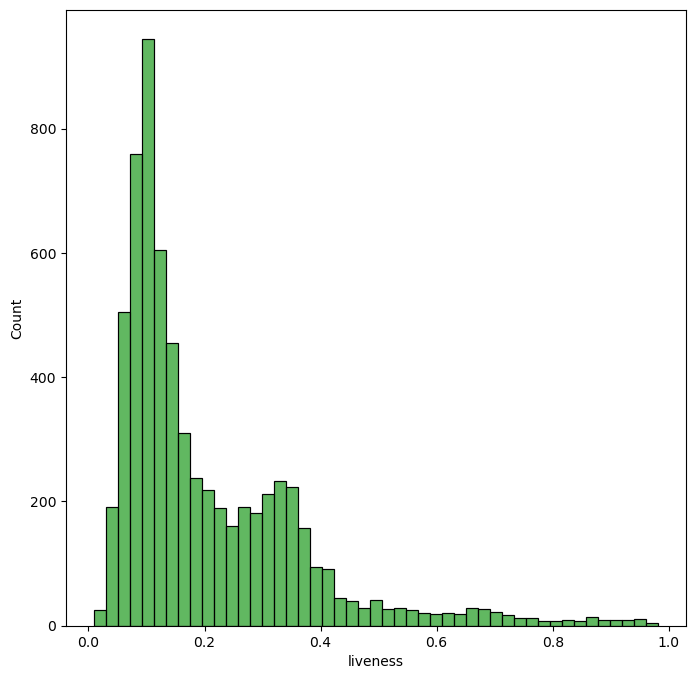

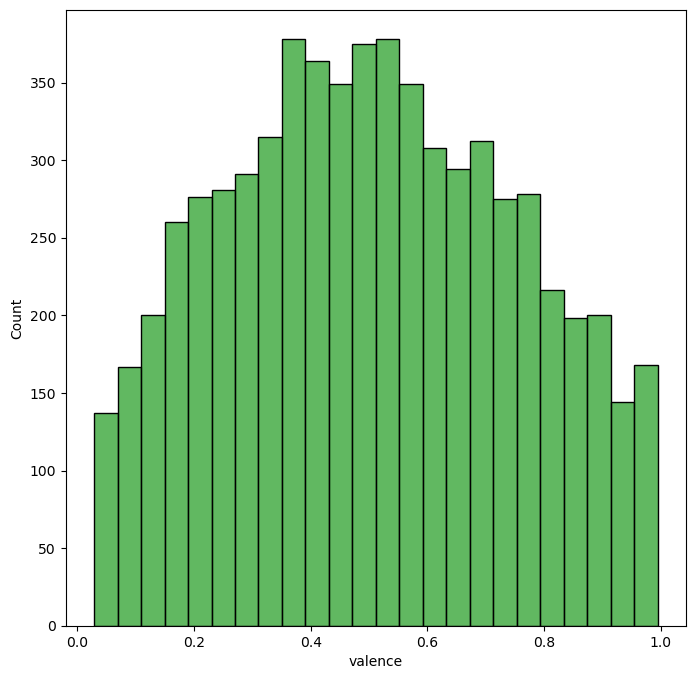

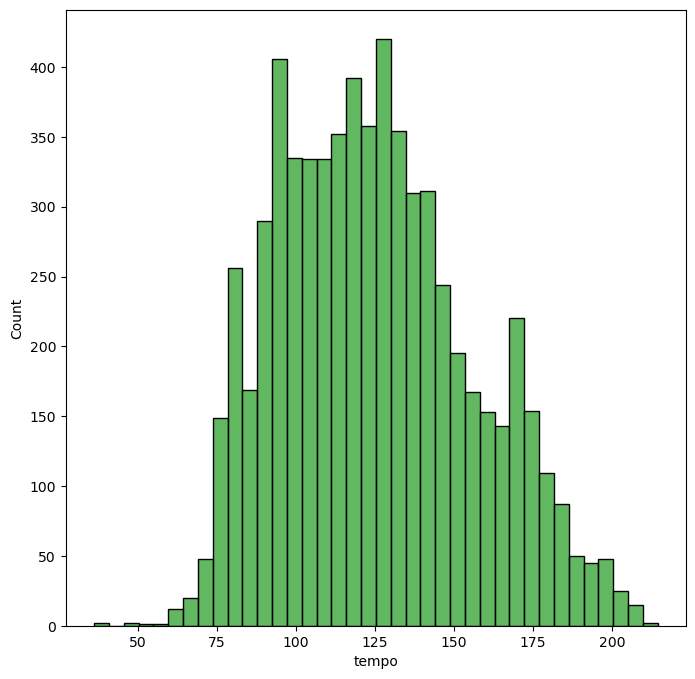

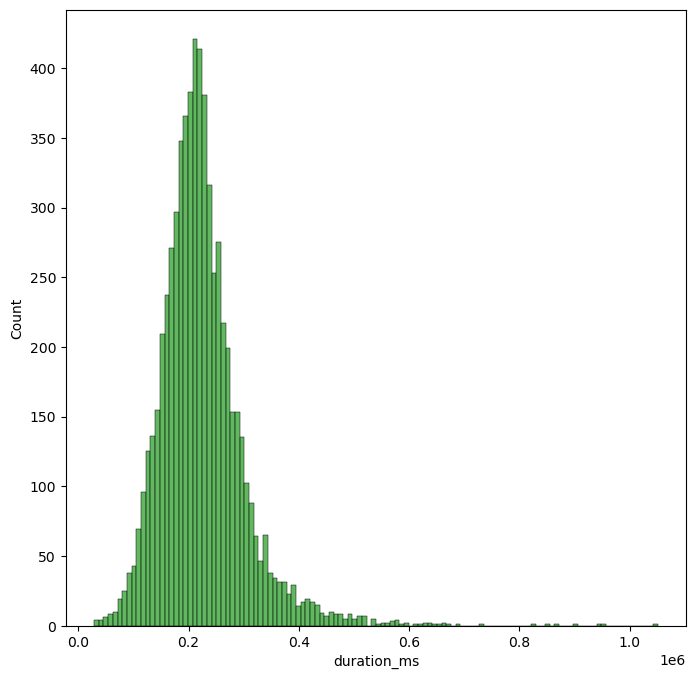

In [15]:
for col in num_features:
    fig, axes = plt.subplots(figsize = (8,8))
    sns.histplot(x=col, data = num_features, color="tab:green")

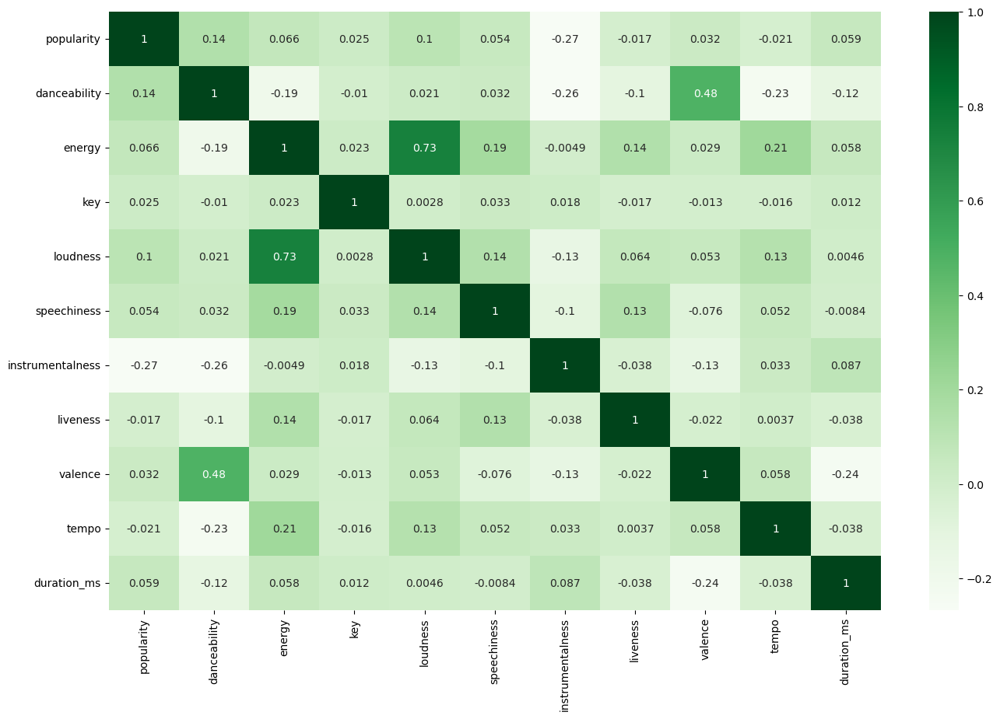

In [16]:
fig, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(num_features.corr(), cmap ="Greens", annot=True);

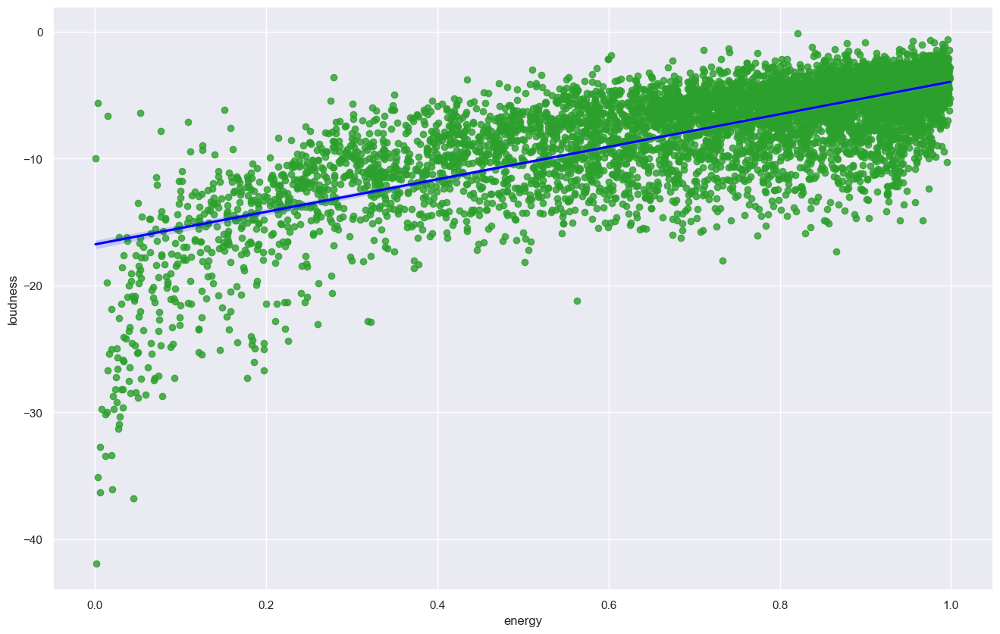

In [17]:
sns.set_theme(color_codes=True)
plt.subplots(figsize=(16,10))
sns.regplot(x = 'energy', y = 'loudness', data=spot_df, scatter_kws={"color": "tab:green"}, line_kws={"color": "blue"});

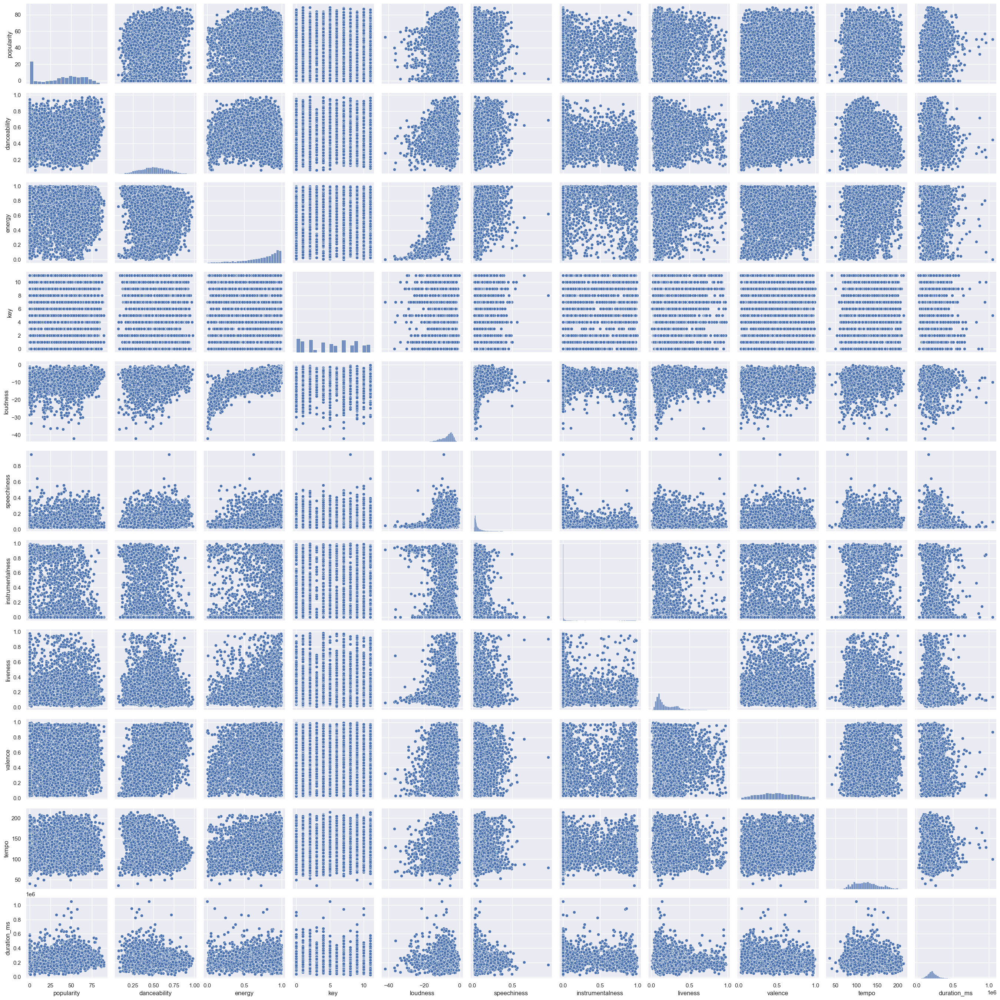

In [18]:
sns.pairplot(num_features);

In [19]:
print("Top 50 Songs means\n --------------------------- \n" , num_features.sort_values(['popularity']).head(50).mean())
print("\n")
print("Bottom 50 songs means\n --------------------------- \n", num_features.sort_values(['popularity']).tail(50).mean())

Top 50 Songs means
 --------------------------- 
 popularity               0.000000
danceability             0.543240
energy                   0.793400
key                      3.980000
loudness                -5.560980
speechiness              0.078846
instrumentalness         0.047895
liveness                 0.205490
valence                  0.474420
tempo                  124.068260
duration_ms         223022.000000
dtype: float64


Bottom 50 songs means
 --------------------------- 
 popularity              84.400000
danceability             0.627200
energy                   0.675220
key                      5.520000
loudness                -6.315100
speechiness              0.093498
instrumentalness         0.026515
liveness                 0.165008
valence                  0.525280
tempo                  121.484640
duration_ms         235406.760000
dtype: float64


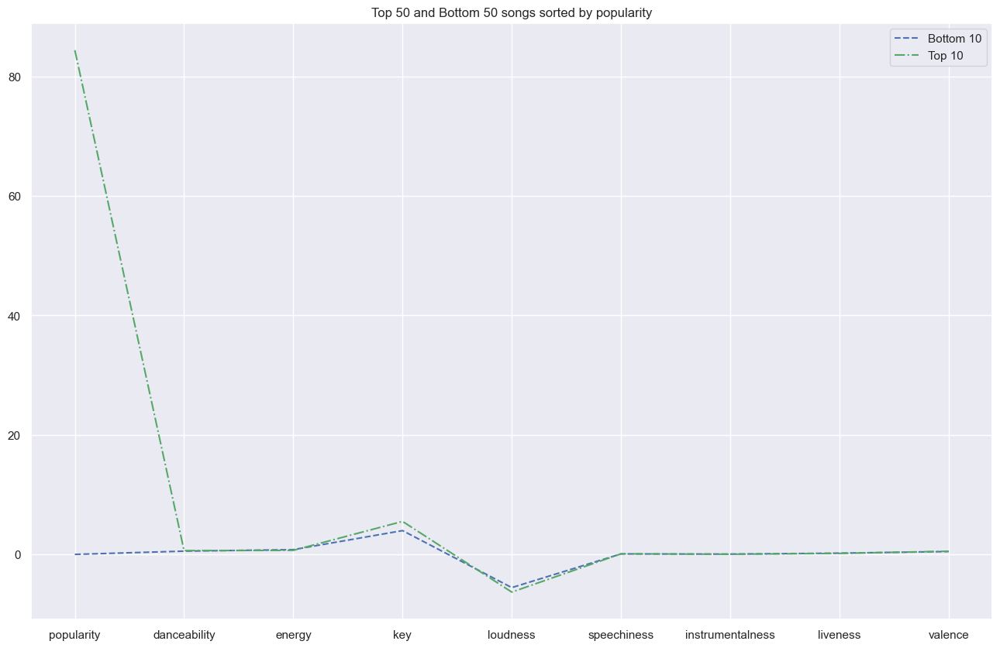

In [20]:
fig, ax = plt.subplots(figsize=(16, 10))
plt.title('Top 50 and Bottom 50 songs sorted by popularity')
plt.plot(num_features.sort_values(['popularity']).head(50).drop(['duration_ms', 'tempo'], axis=1).mean(),
         color = "b", linestyle = '--')
plt.plot(num_features.sort_values(['popularity']).tail(50).drop(['duration_ms', 'tempo'], axis=1).mean(),
         color = "g", linestyle = "dashdot")
plt.legend(labels = ["Bottom 10", "Top 10"]);

In [21]:
rec_df = spot_df.copy()
rec_df.head()

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


In [22]:
# Creating df with just the audio features
rec_df_features = rec_df.select_dtypes(np.number)

In [23]:
rec_df_features.head()

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


# Building Recommendation System

In [24]:
# https://towardsdatascience.com/how-to-build-an-amazing-music-recommendation-system-4cce2719a572

def baseline_clustering_pipeline(scaler, model, df):
    song_cluster_pipeline = Pipeline(steps = [('scaler', scaler),
                                              ('cluster_model', model)])
       
    songs = df.select_dtypes(np.number)   
    song_cluster_labels = song_cluster_pipeline.fit_predict(songs)
    df['cluster_label'] = song_cluster_labels
    print('Silhouette Score: ', silhouette_score(songs, song_cluster_labels), '\n\n -------------------------- \n\n')
    print('Calinski Harabasz Score: ', calinski_harabasz_score(songs, song_cluster_labels), 
          ' \n\n -------------------------- \n\n')
    
    print('Davies Bouldin Score: ', davies_bouldin_score(songs, song_cluster_labels), '\n\n -------------------------- \n\n')
    return df

In [25]:
def PCA_pipeline(scaler, df):
    pca_pipeline = Pipeline([('scaler', scaler), ('PCA', PCA(n_components=2))])
    songs = df.select_dtypes(np.number) 
    song_embedding = pca_pipeline.fit_transform(songs)
    projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
    projection['artist'] = df['artist']
    projection['title'] = df['track_name']
    projection['cluster'] = df['cluster_label']
    return projection

In [26]:
def plot_clusters(projection, x, y):
    fig = px.scatter(projection, x= 'x', y= 'y', color='cluster', hover_data=['x', 'y', 'title'])
    fig.show()

In [27]:
def clustering_metrics(df_num, preds):
    print('Silhouette Score: ', silhouette_score(df_num, preds), '\n\n -------------------------- \n\n')
    print('Calinski Harabasz Score: ', calinski_harabasz_score(df_num, preds), 
          ' \n\n -------------------------- \n\n')
    
    print('Davies Bouldin Score: ', davies_bouldin_score(df_num, preds), '\n\n -------------------------- \n\n')

## Working with UMAP

In [ ]:
umap_play_df = rec_df_features.copy()
umap_play_df

In [ ]:
reducer = umap.UMAP()

In [ ]:
ss = StandardScaler()

In [ ]:
umap_play_df_scaled = ss.fit_transform(umap_play_df)

In [ ]:
umap_play_df_embedded = reducer.fit_transform(umap_play_df_scaled)

In [ ]:
sns.scatterplot(x = umap_play_df_embedded[:, 0], y = umap_play_df_embedded[:, 1], data = umap_play_df_embedded);

In [ ]:
np.count_nonzero(umap_play_df_embedded[:, 0])

In [ ]:
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(umap_play_df_scaled);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)))
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1])
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], s=100)
    plt.title(title, fontsize=18)

In [ ]:
for n in (2, 5, 10, 20, 50, 100, 200):
    draw_umap(n_neighbors=n, title='n_neighbors = {}'.format(n), n_components=2)

In [ ]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist = {}'.format(d), n_components=2)

In [ ]:
for m in ("euclidean", "manhattan", "chebyshev", "minkowski"):
    draw_umap(n_components=2, metric=m, title='metric = {}'.format(m))
    

In [ ]:
for n in (1, 2, 3):
    draw_umap(n_components=n, title='n_components = {}'.format(n))

## Baseline KMeans with UMAP

In [ ]:
kmeans_cluster_pipeline = Pipeline(steps = [('scaler', StandardScaler()),('umap', umap.UMAP()),('kmeans', KMeans())])

In [ ]:
kmeans_song_df = rec_df.select_dtypes(np.number)
kmeans_song_df

In [ ]:
song_cluster_labels = kmeans_cluster_pipeline.fit_predict(kmeans_song_df)

In [ ]:
kmeans_song_df['cluster_label'] = song_cluster_labels

In [ ]:
kmeans_song_df

In [ ]:
clustering_metrics(kmeans_song_df, song_cluster_labels)

In [ ]:
kmeans_umap_db = kmeans_cluster_pipeline['umap'].transform(rec_df.select_dtypes(np.number))

In [ ]:
kmeans_umap_df = pd.DataFrame(kmeans_umap_db, columns=['umap_1', 'umap_2'])

In [ ]:
kmeans_umap_df['cluster'] = kmeans_song_df['cluster_label']

In [ ]:
kmeans_umap_df

In [ ]:
sns.countplot(data=kmeans_umap_df, x = 'cluster');

In [ ]:
kmeans_umap_df['cluster'].value_counts()

In [ ]:
sns.histplot(x = 'umap_1', y = 'umap_2', data = kmeans_umap_df, hue = 'cluster', palette = 'tab10');

In [ ]:
px.scatter(kmeans_umap_df, x = 'umap_1', y = 'umap_2', color = 'cluster', hover_data = ['umap_1', 'umap_2'])

## Baseline KMeans with PCA

In [42]:
pca_kmeans_df = rec_df.copy()

In [43]:
pca_kmeans_df

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,N.W.A.,4EnEZVjo3w1cwcQYePccay,63,Straight Outta Compton,Gangsta Gangsta,1pOIpxfrQ8AszXZdKR3aH3,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4
6510,Various Artists,3y24n3XhZ96wgwRXjvS17T,42,Clueless / Original Motion Picture Soundtrack,Rollin' With My Homies,3qTiTZJJDM3gZ8TFiMMr0j,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4
6511,Nas,20qISvAhX20dpIbOOzGK3q,70,Illmatic,N.Y. State of Mind,0trHOzAhNpGCsGBEu7dOJo,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4
6512,Nas,20qISvAhX20dpIbOOzGK3q,66,I Am...,Nas Is Like,3gY6tiCNsuVi6s8kPV6aQg,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4


In [44]:
kmeans_pca_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                        ('pca', PCA(n_components=9)),
                                        ('kmeans', KMeans())])

In [45]:
pca_kmeans_preds = kmeans_pca_cluster_pipeline.fit_predict(pca_kmeans_df.select_dtypes(np.number))

In [46]:
pca_kmeans_preds

array([5, 2, 6, ..., 6, 4, 1])

In [47]:
kmeans_pca_cluster_pipeline['pca'].components_

array([[-0.15024599,  0.06472382, -0.62318258, -0.04052279, -0.59864311,
         0.11889898, -0.26627048,  0.13958413, -0.16639778, -0.03695767,
        -0.22428204, -0.02857896, -0.20042663],
       [-0.24426559, -0.61234131,  0.10952141,  0.01973029, -0.0391188 ,
        -0.0350763 , -0.00411959,  0.39941951,  0.08316468, -0.50924764,
         0.16689922,  0.25491224, -0.17773449],
       [ 0.40162771,  0.07881235, -0.1011505 ,  0.30852383, -0.06181144,
        -0.36924105,  0.19415123, -0.20094982, -0.07538435, -0.3538427 ,
        -0.39818197,  0.46558627,  0.05121881],
       [ 0.29846024, -0.11955139, -0.08939126, -0.40817727, -0.07770734,
         0.42499458,  0.26805794, -0.39518958,  0.40139245, -0.22698923,
        -0.02753222, -0.03940501, -0.30395722],
       [-0.26416704,  0.02985767, -0.08584518,  0.38425409, -0.14224333,
        -0.34511436,  0.4309836 ,  0.02198419,  0.47350792,  0.06926875,
        -0.05624375, -0.40729778, -0.22510819],
       [ 0.36381394, -0.151424

In [48]:
kmeans_pca_cluster_pipeline['pca'].explained_variance_ratio_

array([0.15472216, 0.14072337, 0.0965703 , 0.08836944, 0.08412183,
       0.07647209, 0.06807298, 0.0671418 , 0.06324534])

In [49]:
pca_kmeans_df['cluster_label'] = pca_kmeans_preds

In [50]:
pca_kmeans_df

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster_label
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4,5
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4,2
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4,6
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4,5
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,N.W.A.,4EnEZVjo3w1cwcQYePccay,63,Straight Outta Compton,Gangsta Gangsta,1pOIpxfrQ8AszXZdKR3aH3,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4,4
6510,Various Artists,3y24n3XhZ96wgwRXjvS17T,42,Clueless / Original Motion Picture Soundtrack,Rollin' With My Homies,3qTiTZJJDM3gZ8TFiMMr0j,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4,5
6511,Nas,20qISvAhX20dpIbOOzGK3q,70,Illmatic,N.Y. State of Mind,0trHOzAhNpGCsGBEu7dOJo,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4,6
6512,Nas,20qISvAhX20dpIbOOzGK3q,66,I Am...,Nas Is Like,3gY6tiCNsuVi6s8kPV6aQg,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4,4


In [51]:
projection_kmeans = PCA_pipeline(StandardScaler(), pca_kmeans_df)

In [52]:
projection_kmeans

,x,y,artist,title,cluster
0,-0.995945,-0.083803,Bon Jovi,Livin' On A Prayer,5.0
1,0.514389,2.348639,Bon Jovi,Wanted Dead Or Alive,2.0
2,0.378906,-0.091199,Queen,We Are The Champions - Remastered 2011,6.0
3,-0.144329,-1.809673,Queen,We Will Rock You - Remastered 2011,5.0
4,-1.777446,-0.129335,Bon Jovi,You Give Love A Bad Name,6.0
...,...,...,...,...,...
6508,-1.289160,-1.211171,Louis Armstrong,Blue Yodel No. 9 - 1996 Remastered,1.0
6509,-0.411758,-2.539128,N.W.A.,Gangsta Gangsta,4.0
6510,-2.403316,-0.875963,Various Artists,Rollin' With My Homies,5.0
6511,-2.122928,-0.743871,Nas,N.Y. State of Mind,6.0


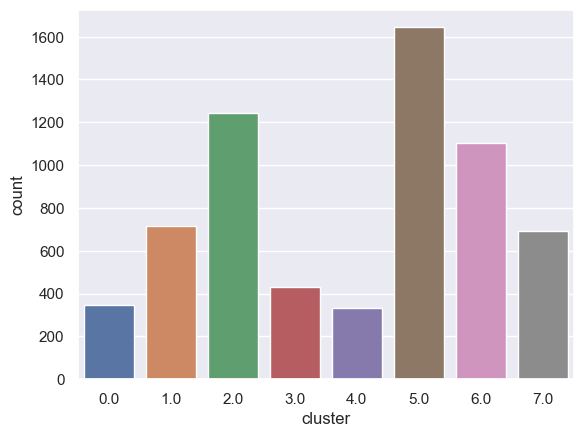

In [53]:
sns.countplot(data=projection_kmeans, x = 'cluster');

In [54]:
projection_kmeans['cluster'].value_counts()

5.0    1644
2.0    1242
6.0    1105
1.0     715
7.0     694
3.0     432
0.0     346
4.0     334
Name: cluster, dtype: int64

In [55]:
plot_clusters(projection_kmeans, 'x', 'y')

In [56]:
clustering_metrics(pca_kmeans_df.select_dtypes(np.number), pca_kmeans_preds)

Silhouette Score:  -0.12254638070422644 

 -------------------------- 


Calinski Harabasz Score:  55.16957647464956  

 -------------------------- 


Davies Bouldin Score:  69.50243893790984 

 -------------------------- 




## Gridsearch KMeans with UMAP

In [106]:
gs_kmeans_umap_df = rec_df.copy().select_dtypes(np.number) 

In [108]:
gs_kmeans_umap_df

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4
6510,42,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4
6511,70,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4
6512,66,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4


In [105]:
gs_kmeans_umap_df.dtypes

popularity            int64
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
dtype: object

In [114]:
kmeans_pipe_gs_umap = Pipeline(steps = [('scaler', StandardScaler()),
                                        ('umap', umap.UMAP()),
                                        ('model', KMeans())])


In [115]:
# https://stackoverflow.com/questions/44636370/scikit-learn-gridsearchcv-without-cross-validation-unsupervised-learning

def cv_silhouette_scorer(estimator, X):
    estimator.fit(X)
    cluster_labels = estimator['model'].labels_
    num_labels = len(set(cluster_labels))
    num_samples = len(X.index)
    if num_labels == 1 or num_labels == num_samples:
        return -1
    else:
        return silhouette_score(X, cluster_labels)

cv = [(slice(None), slice(None))]

In [116]:
kmeans_umap_grid = {'umap__n_neighbors':[2, 50, 100],
                    'umap__min_dist':[0.5, 0.8],
                    'model__n_clusters': [7, 20, 57, 80, 107],
                    'model__n_init':[10, 50, 100],
                        }


In [117]:
kmeans_gs_umap = GridSearchCV(estimator=kmeans_pipe_gs_umap, 
                              param_grid = kmeans_umap_grid, 
                              scoring = cv_silhouette_scorer,
                             cv=cv)

In [118]:
kmeans_gs_umap.fit(gs_kmeans_umap_df)

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisatio

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisatio

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisatio

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

C:\Users\Jonathan\anaconda3\envs\recommendation-env\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisatio

GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('umap', UMAP()), ('model', KMeans())]),
             param_grid={'model__n_clusters': [7, 20, 57, 80, 107],
                         'model__n_init': [10, 50, 100],
                         'umap__min_dist': [0.5, 0.8],
                         'umap__n_neighbors': [2, 50, 100]},
             scoring=<function cv_silhouette_scorer at 0x000001DDA6150670>)

In [122]:
kmeans_gs_umap.best_params_

{'model__n_clusters': 7,
 'model__n_init': 10,
 'umap__min_dist': 0.5,
 'umap__n_neighbors': 2}

In [123]:
kmeans_gs_umap.best_score_

-0.05641928944434591

In [133]:
kmeans_gs_umap.scorer_

<function __main__.cv_silhouette_scorer(estimator, X)>

In [120]:
preds_kmeans_umap = kmeans_gs_umap.predict(gs_kmeans_umap_df)

In [121]:
preds_kmeans_umap

array([3, 0, 3, ..., 1, 3, 4])

In [126]:
gs_kmeans_umap_df['cluster'] = preds_kmeans_umap

In [202]:
gs_kmeans_umap_df

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4,3
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4,0
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4,3
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4,4
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4,5
6510,42,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4,2
6511,70,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4,1
6512,66,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4,3


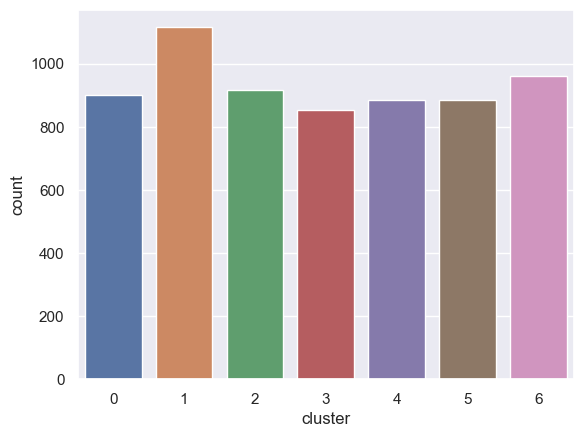

In [131]:
sns.countplot(data=gs_kmeans_umap_df, x = 'cluster');

In [132]:
gs_kmeans_umap_df['cluster'].value_counts()

1    1115
6     962
2     915
0     899
5     885
4     883
3     854
Name: cluster, dtype: int64

In [177]:
kmeans_umap_gs_db = kmeans_gs_umap['umap'].transform(rec_df.select_dtypes(np.number))

TypeError: 'GridSearchCV' object is not subscriptable

In [186]:
kmeans_gs_umap_db = kmeans_gs_umap.best_estimator_.named_steps['umap'].transform(gs_kmeans_umap_df.drop('cluster', axis=1))

In [188]:
kmeans_gs_umap_df = pd.DataFrame(kmeans_gs_umap_db, columns=['umap_1', 'umap_2'])

In [203]:
kmeans_gs_umap_df.isna().sum()

umap_1     0
umap_2     0
cluster    1
dtype: int64

In [191]:
kmeans_gs_umap_df['cluster'] = gs_kmeans_umap_df['cluster']

In [192]:
kmeans_gs_umap_df

,umap_1,umap_2,cluster
0,-8.704521,11.567929,3.0
1,-8.756720,11.610332,0.0
2,-8.742958,11.581551,3.0
3,-8.715471,11.615355,4.0
4,-8.721158,11.594741,1.0
...,...,...,...
6508,-8.755409,11.644356,2.0
6509,-8.889341,11.660008,5.0
6510,-8.760011,11.602400,2.0
6511,-8.834349,11.646388,1.0


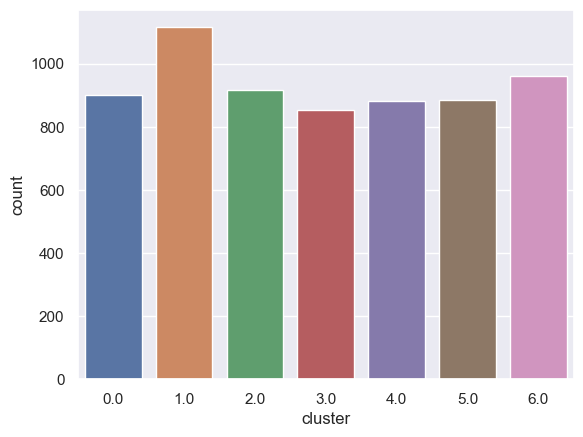

In [194]:
sns.countplot(data=kmeans_gs_umap_df, x = 'cluster');

In [195]:
kmeans_gs_umap_df['cluster'].value_counts()

1.0    1115
6.0     962
2.0     915
0.0     899
5.0     885
4.0     882
3.0     854
Name: cluster, dtype: int64

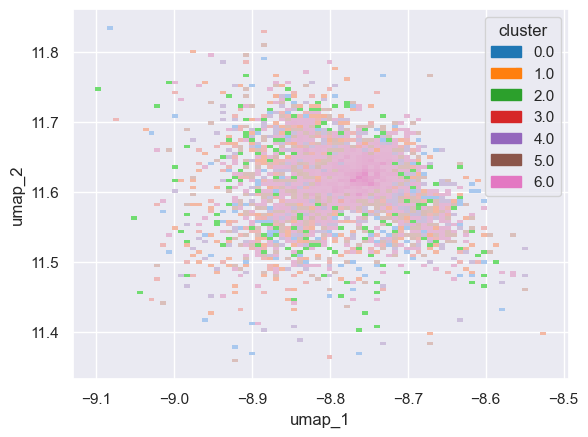

In [196]:
sns.histplot(x = 'umap_1', y = 'umap_2', data = kmeans_gs_umap_df, hue = 'cluster', palette = 'tab10');

In [197]:
px.scatter(kmeans_gs_umap_df, x = 'umap_1', y = 'umap_2', color = 'cluster', hover_data = ['umap_1', 'umap_2'])

## Gridsearch KMeans with PCA

In [134]:
gs_kmeans_pca_df = rec_df.copy().select_dtypes(np.number)

In [136]:
gs_kmeans_pca_df

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4
6510,42,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4
6511,70,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4
6512,66,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4


In [142]:
kmeans_pipe_gs_pca = Pipeline(steps = [('scaler', StandardScaler()),
                                        ('pca', PCA()),
                                        ('model', KMeans())])

In [143]:
kmeans_pca_grid = {'pca__n_components':[9, 11, 13, 'mle'],
                    'model__n_clusters': [7, 20, 57, 80, 107],
                    'model__n_init':[10, 50, 100]
                  }


In [144]:
kmeans_gs_pca = GridSearchCV(estimator=kmeans_pipe_gs_pca,
                             param_grid = kmeans_pca_grid,
                             scoring = cv_silhouette_scorer,
                             cv=cv)

In [145]:
kmeans_gs_pca.fit(gs_kmeans_pca_df)

GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()), ('model', KMeans())]),
             param_grid={'model__n_clusters': [7, 20, 57, 80, 107],
                         'model__n_init': [10, 50, 100],
                         'pca__n_components': [9, 11, 13, 'mle']},
             scoring=<function cv_silhouette_scorer at 0x000001DDA6150670>)

In [146]:
preds = kmeans_gs_pca.predict(gs_kmeans_pca_df)

In [147]:
gs_kmeans_pca_df['cluster'] = preds

In [148]:
gs_kmeans_pca_df

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4,5
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4,3
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4,6
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4,5
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4,0
6510,42,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4,5
6511,70,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4,6
6512,66,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4,0


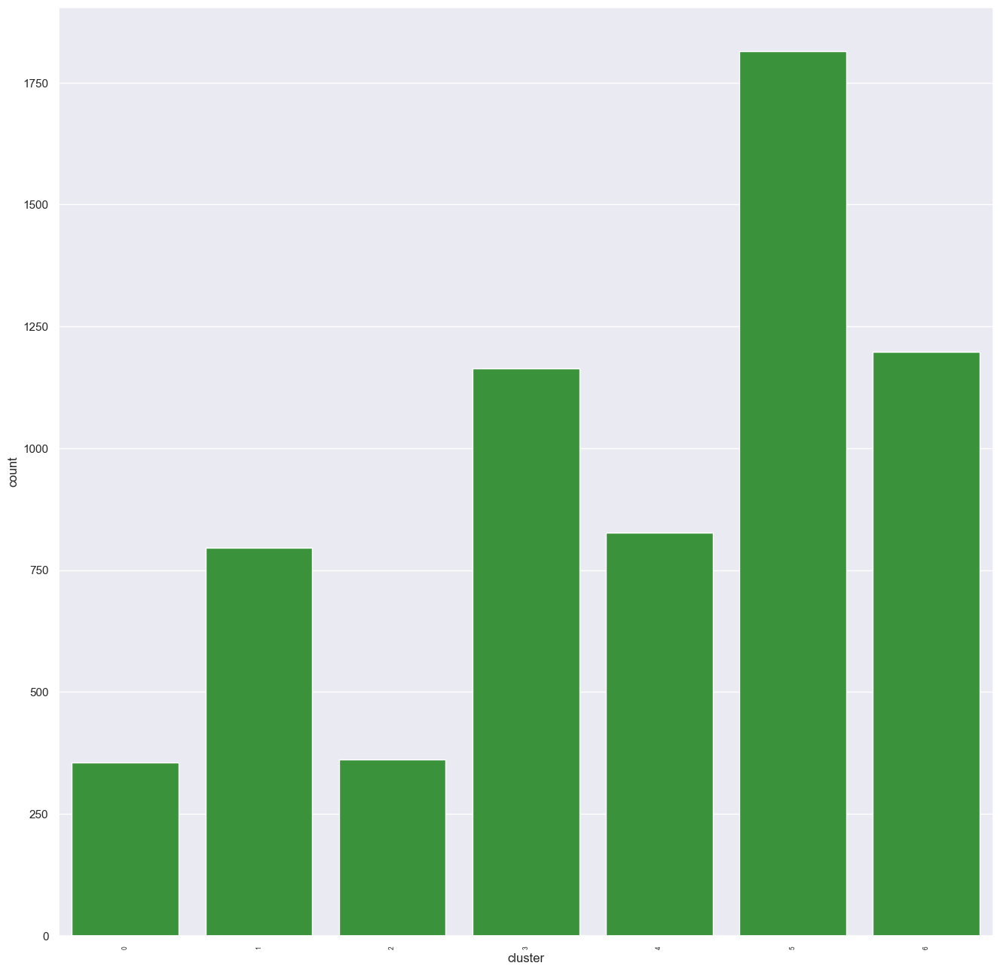

In [149]:
plt.subplots(figsize = (16, 16))
plt.xticks(rotation=90)
plt.tick_params(axis= 'x', labelsize=6)
sns.countplot(data=gs_kmeans_pca_df, x = 'cluster', orient = "h", color = 'tab:green');

In [150]:
clustering_metrics(gs_kmeans_pca_df, preds)

Silhouette Score:  -0.09498087800505883 

 -------------------------- 


Calinski Harabasz Score:  29.712575330835865  

 -------------------------- 


Davies Bouldin Score:  47.82613737365322 

 -------------------------- 




In [151]:
kmeans_gs_pca.best_params_

{'model__n_clusters': 7, 'model__n_init': 50, 'pca__n_components': 9}

In [152]:
kmeans_gs_pca.best_score_

-0.09535195189021965

In [153]:
kmeans_gs_umap.scorer_

<function __main__.cv_silhouette_scorer(estimator, X)>

In [168]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
songs = gs_kmeans_pca_df 
song_embedding = pca_pipeline.fit_transform(songs)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['artist'] = rec_df['artist']
projection['title'] = rec_df['track_name']
projection['cluster'] = gs_kmeans_pca_df['cluster']

In [169]:
projection

,x,y,artist,title,cluster
0,-1.101768,-0.112235,Bon Jovi,Livin' On A Prayer,5.0
1,0.181559,2.231268,Bon Jovi,Wanted Dead Or Alive,3.0
2,0.085650,-0.175770,Queen,We Are The Champions - Remastered 2011,6.0
3,-0.200591,-1.839270,Queen,We Will Rock You - Remastered 2011,5.0
4,-1.787903,-0.094774,Bon Jovi,You Give Love A Bad Name,6.0
...,...,...,...,...,...
6508,0.051485,-0.805299,Louis Armstrong,Blue Yodel No. 9 - 1996 Remastered,1.0
6509,-0.484856,-2.561354,N.W.A.,Gangsta Gangsta,0.0
6510,-2.329173,-0.840620,Various Artists,Rollin' With My Homies,5.0
6511,-0.698453,-0.305301,Nas,N.Y. State of Mind,6.0


In [170]:
plot_clusters(projection, 'x', 'y')

#### Using Affinity Propagation

In [ ]:
ap_df = baseline_clustering_pipeline(StandardScaler(), AffinityPropagation(), rec_df)

In [ ]:
sorted_df = ap_df['cluster_label'].unique()
print(sorted(sorted_df))

In [ ]:
projection_2 = PCA_pipeline(StandardScaler(), ap_df)

In [ ]:
projection_2[projection_2['cluster'] == 62]

In [ ]:
plot_clusters(projection_2, 'x', 'y')

#### Using Agglomerative Clustering

In [ ]:
ac_df = baseline_clustering_pipeline(StandardScaler(), AgglomerativeClustering(n_clusters = 40), rec_df)

In [ ]:
ac_df

In [ ]:
projection_3 = PCA_pipeline(StandardScaler(), ac_df)

In [ ]:
projection_3

In [ ]:
plot_clusters(projection_3, 'x', 'y')

In [ ]:
projection_3['cluster'].value_counts()

#### Using Birch

In [ ]:
birch_df = baseline_clustering_pipeline(StandardScaler(), Birch(n_clusters = 40), rec_df)

In [ ]:
birch_df

In [ ]:
projection_birch = PCA_pipeline(StandardScaler(), birch_df)

In [ ]:
projection_birch

In [ ]:
plot_clusters(projection_birch, 'x', 'y')

#### Using MiniBatchKMeans

In [ ]:
mbkmeans_df = baseline_clustering_pipeline(StandardScaler(), MiniBatchKMeans(n_clusters = 300, batch_size = 256), rec_df)

In [ ]:
mbkmeans_df

In [ ]:
projection_4 = PCA_pipeline(StandardScaler(), mbkmeans_df)

In [ ]:
projection_4

In [ ]:
plot_clusters(projection_4, 'x', 'y')

#### Using OPTICS

In [ ]:
op_df = baseline_clustering_pipeline(StandardScaler(), OPTICS(), rec_df)

In [ ]:
op_df

In [ ]:
projection_5 = PCA_pipeline(StandardScaler(), op_df)

In [ ]:
projection_5

In [ ]:
plot_clusters(projection_5, 'x', 'y')

#### Using GaussianMixture

In [ ]:
gm_df = baseline_clustering_pipeline(StandardScaler(), GaussianMixture(n_components = 40), rec_df)

In [ ]:
gm_df

In [ ]:
projection_7 = PCA_pipeline(StandardScaler(), gm_df)

In [ ]:
projection_7

In [ ]:
plot_clusters(projection_7, 'x', 'y')

In [ ]:
projection_7[projection_7['cluster'] == 264]

In [ ]:
cluster_19 = projection.loc[projection['cluster'] == 19]

In [ ]:
cluster_19.columns

In [ ]:
def dist(row):
    x = row['x']
    y = row['y']
    distance=np.sqrt((xt-x)**2 + (yt-y)**2)
    return distance

xt = cluster_19.loc[cluster_19['title'] == "Don't Stop Me Now - Remastered 2011", 'x']
yt = cluster_19.loc[cluster_19['title'] == "Don't Stop Me Now - Remastered 2011", 'y']

cluster_19['distance'] = cluster_19.apply(dist, axis=1)

In [ ]:
cluster_19

In [ ]:
projection['distance'] = projection.apply(dist, axis=1)

In [ ]:
projection.sort_values('distance')[:10]

In [ ]:
xt = projection.loc[projection['title'] == "Livin' On A Prayer", 'x']
yt = projection.loc[projection['title'] == "Livin' On A Prayer", 'y']

projection['distance'] = projection.apply(dist, axis=1)
projection.sort_values('distance')[0:10]